# Low-light image enhancement using MIRNet



In [ ]:
!pip install keras==2.13.1
!pip install tensorflow==2.13.0

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%pip install patool
import patoolib
patoolib.extract_archive("/content/drive/MyDrive/Dissertation/data.rar", outdir="/content/")

## Introduction

With the goal of recovering high-quality image content from its degraded version, image
restoration enjoys numerous applications, such as in
photography, security, medical imaging, and remote sensing. In this example, we implement the
**MIRNet** model for low-light image enhancement, a fully-convolutional architecture that
learns an enriched set of
features that combines contextual information from multiple scales, while
simultaneously preserving the high-resolution spatial details.

### References:

- [Learning Enriched Features for Real Image Restoration and Enhancement](https://arxiv.org/abs/2003.06792)
- [The Retinex Theory of Color Vision](http://www.cnbc.cmu.edu/~tai/cp_papers/E.Land_Retinex_Theory_ScientifcAmerican.pdf)
- [Two deterministic half-quadratic regularization algorithms for computed imaging](https://ieeexplore.ieee.org/document/413553)

In [ ]:
import os
import cv2
import random
import numpy as np
from glob import glob
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from keras import layers

In [ ]:
!pip install patool
import patoolib
patoolib.extract_archive("/content/drive/MyDrive/dis/images.rar", outdir="/content/")

In [ ]:
# !gdown https://drive.google.com/uc?id=1DdGIJ4PZPlF2ikl8mNM9V-PdVxVLbQi6
!unzip -q /content/drive/MyDrive/dis/images.rar

## Creating a TensorFlow Dataset

We use 300 image pairs from the LoL Dataset's training set for training,
and we use the remaining 185 image pairs for validation.
We generate random crops of size `128 x 128` from the image pairs to be
used for both training and validation.

In [ ]:
random.seed(10)

IMAGE_SIZE = 128
BATCH_SIZE = 4
# MAX_TRAIN_IMAGES = 300


def read_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image.set_shape([None, None, 3])
    image = tf.cast(image, dtype=tf.float32) / 255.0
    return image


def random_crop(low_image, enhanced_image):
    low_image_shape = tf.shape(low_image)[:2]
    low_w = tf.random.uniform(
        shape=(), maxval=low_image_shape[1] - IMAGE_SIZE + 1, dtype=tf.int32
    )
    low_h = tf.random.uniform(
        shape=(), maxval=low_image_shape[0] - IMAGE_SIZE + 1, dtype=tf.int32
    )
    enhanced_w = low_w
    enhanced_h = low_h
    low_image_cropped = low_image[
        low_h : low_h + IMAGE_SIZE, low_w : low_w + IMAGE_SIZE
    ]
    enhanced_image_cropped = enhanced_image[
        enhanced_h : enhanced_h + IMAGE_SIZE, enhanced_w : enhanced_w + IMAGE_SIZE
    ]
    return low_image_cropped, enhanced_image_cropped


def load_data(low_light_image_path, enhanced_image_path):
    low_light_image = read_image(low_light_image_path)
    enhanced_image = read_image(enhanced_image_path)
    low_light_image, enhanced_image = random_crop(low_light_image, enhanced_image)
    return low_light_image, enhanced_image


def get_dataset(low_light_images, enhanced_images):
    dataset = tf.data.Dataset.from_tensor_slices((low_light_images, enhanced_images))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset



In [ ]:
train_low_light_images = sorted(glob("/content/data/train/projections/*"))
train_enhanced_images = sorted(glob("/content/data/train/images/*"))

val_low_light_images = sorted(glob("/content/data/val/projections/*"))
val_enhanced_images = sorted(glob("/content/data/val/images/*"))

test_low_light_images = sorted(glob("/content/data/test/projections/*"))
test_enhanced_images = sorted(glob("/content/data/test/images/*"))


train_dataset = get_dataset(train_low_light_images, train_enhanced_images)
val_dataset = get_dataset(val_low_light_images, val_enhanced_images)


print("Train Dataset:", train_dataset)
print("Val Dataset:", val_dataset)

In [ ]:
test_low_light_images = sorted(glob("/content/drive/MyDrive/GAN/test/projections/*"))
test_enhanced_images = sorted(glob("/content/drive/MyDrive/GAN/test/original/*"))
test_dataset = get_dataset(test_low_light_images, test_enhanced_images)
print("Val Dataset:", test_dataset)

Val Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(4, None, None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, None, None, 3), dtype=tf.float32, name=None))>


## MIRNet Model

Here are the main features of the MIRNet model:

- A feature extraction model that computes a complementary set of features across multiple
spatial scales, while maintaining the original high-resolution features to preserve
precise spatial details.
- A regularly repeated mechanism for information exchange, where the features across
multi-resolution branches are progressively fused together for improved representation
learning.
- A new approach to fuse multi-scale features using a selective kernel network
that dynamically combines variable receptive fields and faithfully preserves
the original feature information at each spatial resolution.
- A recursive residual design that progressively breaks down the input signal
in order to simplify the overall learning process, and allows the construction
of very deep networks.


![](https://raw.githubusercontent.com/soumik12345/MIRNet/master/assets/mirnet_architecture.png)

### Selective Kernel Feature Fusion

The Selective Kernel Feature Fusion or SKFF module performs dynamic adjustment of
receptive fields via two operations: **Fuse** and **Select**. The Fuse operator generates
global feature descriptors by combining the information from multi-resolution streams.
The Select operator uses these descriptors to recalibrate the feature maps (of different
streams) followed by their aggregation.

**Fuse**: The SKFF receives inputs from three parallel convolution streams carrying
different scales of information. We first combine these multi-scale features using an
element-wise sum, on which we apply Global Average Pooling (GAP) across the spatial
dimension. Next, we apply a channel- downscaling convolution layer to generate a compact
feature representation which passes through three parallel channel-upscaling convolution
layers (one for each resolution stream) and provides us with three feature descriptors.

**Select**: This operator applies the softmax function to the feature descriptors to
obtain the corresponding activations that are used to adaptively recalibrate multi-scale
feature maps. The aggregated features are defined as the sum of product of the corresponding
multi-scale feature and the feature descriptor.

![](https://i.imgur.com/7U6ixF6.png)

In [ ]:
def selective_kernel_feature_fusion(
    multi_scale_feature_1, multi_scale_feature_2, multi_scale_feature_3
):
    channels = list(multi_scale_feature_1.shape)[-1]
    combined_feature = layers.Add()(
        [multi_scale_feature_1, multi_scale_feature_2, multi_scale_feature_3]
    )
    gap = layers.GlobalAveragePooling2D()(combined_feature)
    channel_wise_statistics = tf.reshape(gap, shape=(-1, 1, 1, channels))
    compact_feature_representation = layers.Conv2D(
        filters=channels // 8, kernel_size=(1, 1), activation="relu"
    )(channel_wise_statistics)
    feature_descriptor_1 = layers.Conv2D(
        channels, kernel_size=(1, 1), activation="softmax"
    )(compact_feature_representation)
    feature_descriptor_2 = layers.Conv2D(
        channels, kernel_size=(1, 1), activation="softmax"
    )(compact_feature_representation)
    feature_descriptor_3 = layers.Conv2D(
        channels, kernel_size=(1, 1), activation="softmax"
    )(compact_feature_representation)
    feature_1 = multi_scale_feature_1 * feature_descriptor_1
    feature_2 = multi_scale_feature_2 * feature_descriptor_2
    feature_3 = multi_scale_feature_3 * feature_descriptor_3
    aggregated_feature = layers.Add()([feature_1, feature_2, feature_3])
    return aggregated_feature


### Dual Attention Unit

The Dual Attention Unit or DAU is used to extract features in the convolutional streams.
While the SKFF block fuses information across multi-resolution branches, we also need a
mechanism to share information within a feature tensor, both along the spatial and the
channel dimensions which is done by the DAU block. The DAU suppresses less useful
features and only allows more informative ones to pass further. This feature
recalibration is achieved by using **Channel Attention** and **Spatial Attention**
mechanisms.

The **Channel Attention** branch exploits the inter-channel relationships of the
convolutional feature maps by applying squeeze and excitation operations. Given a feature
map, the squeeze operation applies Global Average Pooling across spatial dimensions to
encode global context, thus yielding a feature descriptor. The excitation operator passes
this feature descriptor through two convolutional layers followed by the sigmoid gating
and generates activations. Finally, the output of Channel Attention branch is obtained by
rescaling the input feature map with the output activations.

The **Spatial Attention** branch is designed to exploit the inter-spatial dependencies of
convolutional features. The goal of Spatial Attention is to generate a spatial attention
map and use it to recalibrate the incoming features. To generate the spatial attention
map, the Spatial Attention branch first independently applies Global Average Pooling and
Max Pooling operations on input features along the channel dimensions and concatenates
the outputs to form a resultant feature map which is then passed through a convolution
and sigmoid activation to obtain the spatial attention map. This spatial attention map is
then used to rescale the input feature map.

![](https://i.imgur.com/Dl0IwQs.png)

In [ ]:
def spatial_attention_block(input_tensor):
    average_pooling = tf.reduce_max(input_tensor, axis=-1)
    average_pooling = tf.expand_dims(average_pooling, axis=-1)
    max_pooling = tf.reduce_mean(input_tensor, axis=-1)
    max_pooling = tf.expand_dims(max_pooling, axis=-1)
    concatenated = layers.Concatenate(axis=-1)([average_pooling, max_pooling])
    feature_map = layers.Conv2D(1, kernel_size=(1, 1))(concatenated)
    feature_map = tf.nn.sigmoid(feature_map)
    return input_tensor * feature_map


def channel_attention_block(input_tensor):
    channels = list(input_tensor.shape)[-1]
    average_pooling = layers.GlobalAveragePooling2D()(input_tensor)
    feature_descriptor = tf.reshape(average_pooling, shape=(-1, 1, 1, channels))
    feature_activations = layers.Conv2D(
        filters=channels // 8, kernel_size=(1, 1), activation="relu"
    )(feature_descriptor)
    feature_activations = layers.Conv2D(
        filters=channels, kernel_size=(1, 1), activation="sigmoid"
    )(feature_activations)
    return input_tensor * feature_activations


def dual_attention_unit_block(input_tensor):
    channels = list(input_tensor.shape)[-1]
    feature_map = layers.Conv2D(
        channels, kernel_size=(3, 3), padding="same", activation="relu"
    )(input_tensor)
    feature_map = layers.Conv2D(channels, kernel_size=(3, 3), padding="same")(
        feature_map
    )
    channel_attention = channel_attention_block(feature_map)
    spatial_attention = spatial_attention_block(feature_map)
    concatenation = layers.Concatenate(axis=-1)([channel_attention, spatial_attention])
    concatenation = layers.Conv2D(channels, kernel_size=(1, 1))(concatenation)
    return layers.Add()([input_tensor, concatenation])


### Multi-Scale Residual Block

The Multi-Scale Residual Block is capable of generating a spatially-precise output by
maintaining high-resolution representations, while receiving rich contextual information
from low-resolutions. The MRB consists of multiple (three in this paper)
fully-convolutional streams connected in parallel. It allows information exchange across
parallel streams in order to consolidate the high-resolution features with the help of
low-resolution features, and vice versa. The MIRNet employs a recursive residual design
(with skip connections) to ease the flow of information during the learning process. In
order to maintain the residual nature of our architecture, residual resizing modules are
used to perform downsampling and upsampling operations that are used in the Multi-scale
Residual Block.

![](https://i.imgur.com/wzZKV57.png)

In [ ]:
# Recursive Residual Modules
def down_sampling_module(input_tensor):
    channels = list(input_tensor.shape)[-1]
    main_branch = layers.Conv2D(channels, kernel_size=(1, 1), activation="relu")(
        input_tensor
    )
    main_branch = layers.Conv2D(
        channels, kernel_size=(3, 3), padding="same", activation="relu"
    )(main_branch)
    main_branch = layers.MaxPooling2D()(main_branch)
    main_branch = layers.Conv2D(channels * 2, kernel_size=(1, 1))(main_branch)
    skip_branch = layers.MaxPooling2D()(input_tensor)
    skip_branch = layers.Conv2D(channels * 2, kernel_size=(1, 1))(skip_branch)
    return layers.Add()([skip_branch, main_branch])


def up_sampling_module(input_tensor):
    channels = list(input_tensor.shape)[-1]
    main_branch = layers.Conv2D(channels, kernel_size=(1, 1), activation="relu")(
        input_tensor
    )
    main_branch = layers.Conv2D(
        channels, kernel_size=(3, 3), padding="same", activation="relu"
    )(main_branch)
    main_branch = layers.UpSampling2D()(main_branch)
    main_branch = layers.Conv2D(channels // 2, kernel_size=(1, 1))(main_branch)
    skip_branch = layers.UpSampling2D()(input_tensor)
    skip_branch = layers.Conv2D(channels // 2, kernel_size=(1, 1))(skip_branch)
    return layers.Add()([skip_branch, main_branch])


# MRB Block
def multi_scale_residual_block(input_tensor, channels):
    # features
    level1 = input_tensor
    level2 = down_sampling_module(input_tensor)
    level3 = down_sampling_module(level2)
    # DAU
    level1_dau = dual_attention_unit_block(level1)
    level2_dau = dual_attention_unit_block(level2)
    level3_dau = dual_attention_unit_block(level3)
    # SKFF
    level1_skff = selective_kernel_feature_fusion(
        level1_dau,
        up_sampling_module(level2_dau),
        up_sampling_module(up_sampling_module(level3_dau)),
    )
    level2_skff = selective_kernel_feature_fusion(
        down_sampling_module(level1_dau), level2_dau, up_sampling_module(level3_dau)
    )
    level3_skff = selective_kernel_feature_fusion(
        down_sampling_module(down_sampling_module(level1_dau)),
        down_sampling_module(level2_dau),
        level3_dau,
    )
    # DAU 2
    level1_dau_2 = dual_attention_unit_block(level1_skff)
    level2_dau_2 = up_sampling_module((dual_attention_unit_block(level2_skff)))
    level3_dau_2 = up_sampling_module(
        up_sampling_module(dual_attention_unit_block(level3_skff))
    )
    # SKFF 2
    skff_ = selective_kernel_feature_fusion(level1_dau_2, level2_dau_2, level3_dau_2)
    conv = layers.Conv2D(channels, kernel_size=(3, 3), padding="same")(skff_)
    return layers.Add()([input_tensor, conv])


### MIRNet Model

In [ ]:
def recursive_residual_group(input_tensor, num_mrb, channels):
    conv1 = layers.Conv2D(channels, kernel_size=(3, 3), padding="same")(input_tensor)
    for _ in range(num_mrb):
        conv1 = multi_scale_residual_block(conv1, channels)
    conv2 = layers.Conv2D(channels, kernel_size=(3, 3), padding="same")(conv1)
    return layers.Add()([conv2, input_tensor])


def mirnet_model(num_rrg, num_mrb, channels):
    input_tensor = keras.Input(shape=[None, None, 3])
    x1 = layers.Conv2D(channels, kernel_size=(3, 3), padding="same")(input_tensor)
    for _ in range(num_rrg):
        x1 = recursive_residual_group(x1, num_mrb, channels)
    conv = layers.Conv2D(3, kernel_size=(3, 3), padding="same")(x1)
    output_tensor = layers.Add()([input_tensor, conv])
    return keras.Model(input_tensor, output_tensor)


model = mirnet_model(num_rrg=3, num_mrb=2, channels=64)

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True, dpi=64)

In [ ]:
model.summary()

## Training

- We train MIRNet using **Charbonnier Loss** as the loss function and **Adam
Optimizer** with a learning rate of `1e-4`.
- We use **Peak Signal Noise Ratio** or PSNR as a metric which is an expression for the
ratio between the maximum possible value (power) of a signal and the power of distorting
noise that affects the quality of its representation.

In [ ]:
class CustomSaver(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        # if epoch == 1:  # or save after some epoch, each k-th epoch etc.
        self.model.save("/content/drive/MyDrive/Dissertation/model_{}.h5".format(epoch))

In [ ]:
# @keras.saving.register_keras_serializable
def charbonnier_loss(y_true, y_pred):
    return tf.reduce_mean(tf.sqrt(tf.square(y_true - y_pred) + tf.square(1e-3)))

def peak_signal_noise_ratio(y_true, y_pred):
    return tf.image.psnr(y_pred, y_true, max_val=255.0)

def structural_similarity(y_true, y_pred):
    return tf.image.ssim(y_pred, y_true,max_val=255.0)

In [ ]:
optimizer = keras.optimizers.Adam(learning_rate=1e-4)
model.compile(
    optimizer=optimizer, loss=charbonnier_loss, metrics=[peak_signal_noise_ratio, structural_similarity]
)

# History


In [ ]:
import pickle

In [ ]:
keras.utils.get_custom_objects().update({'charbonnier_loss': charbonnier_loss,
                                         'peak_signal_noise_ratio': peak_signal_noise_ratio,
                                          'structural_similarity': structural_similarity
                                         })

with open('/content/drive/MyDrive/MIRNet/training_history.pkl', 'rb') as f:
  history = pickle.load(f)

In [ ]:
history.history

In [ ]:
# from matplotlib import figure
x = [i for i in range(26,46,1)]
plt.figure(figsize=(4, 4))

# plt.subplot(1,3,1)
plt.plot(x , history.history["loss"], label="train Charbonnier loss")
plt.plot(x, history.history["val_loss"], label="val Charbonnier loss")
plt.xlabel("Epochs")
plt.ylabel("Charbonnier Loss")
plt.title("Train and Validation Loss Over Epochs")
plt.legend()
plt.grid()
plt.savefig('/content/drive/MyDrive/MIRNet/char_loss.jpeg')


In [ ]:
plt.figure(figsize=(4, 4))
plt.plot(x, history.history["peak_signal_noise_ratio"], label="train_psnr")
plt.plot(x, history.history["val_peak_signal_noise_ratio"], label="val_psnr")
plt.xlabel("Epochs")
plt.ylabel("PSNR")
plt.title("Train and Validation PSNR Over Epochs")
plt.legend()
plt.grid()
# plt.show()
plt.savefig('/content/drive/MyDrive/MIRNet/psnr.png')

In [ ]:
plt.figure(figsize=(4, 4))
plt.plot(x, history.history["peak_signal_noise_ratio"], label="train_ssim")
plt.plot(x, history.history["val_structural_similarity"], label="val_ssim")
plt.xlabel("Epochs")
plt.ylabel("SSIM")
plt.title("Train and Validation SSIM Over Epochs")
plt.legend()
plt.grid()
plt.savefig('/content/drive/MyDrive/MIRNet/ssim.jpeg')


In [ ]:
saver = CustomSaver()

history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=30,
    callbacks=[
        keras.callbacks.ReduceLROnPlateau(
            monitor="val_peak_signal_noise_ratio",
            factor=0.5,
            patience=5,
            verbose=1,
            min_delta=1e-7,
            mode="max",
        ),
            keras.callbacks.ReduceLROnPlateau(
            monitor="val_structural_similarity",
            factor=0.5,
            patience=5,
            verbose=1,
            min_delta=1e-7,
            mode="max",
        ),
        saver

    ],
)



Epoch 1/30
936/936 [==============================] - 1340s 1s/step - loss: 0.1178 - peak_signal_noise_ratio: 67.1747 - structural_similarity: 0.9955 - val_loss: 0.4218 - val_peak_signal_noise_ratio: 56.1266 - val_structural_similarity: 0.9689 - lr: 1.0000e-04
Epoch 2/30
936/936 [==============================] - 1196s 1s/step - loss: 0.0555 - peak_signal_noise_ratio: 71.7501 - structural_similarity: 0.9989 - val_loss: 0.2259 - val_peak_signal_noise_ratio: 61.2241 - val_structural_similarity: 0.9907 - lr: 1.0000e-04
Epoch 3/30
936/936 [==============================] - 1196s 1s/step - loss: 0.0509 - peak_signal_noise_ratio: 72.5556 - structural_similarity: 0.9991 - val_loss: 0.1815 - val_peak_signal_noise_ratio: 63.5967 - val_structural_similarity: 0.9921 - lr: 1.0000e-04
Epoch 4/30
936/936 [==============================] - 1195s 1s/step - loss: 0.0409 - peak_signal_noise_ratio: 74.1684 - structural_similarity: 0.9994 - val_loss: 0.2945 - val_peak_signal_noise_ratio: 59.0234 - val_str

In [ ]:
saver = CustomSaver()

history = model_loaded.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=9,
    callbacks=[
        keras.callbacks.ReduceLROnPlateau(
            monitor="val_peak_signal_noise_ratio",
            factor=0.5,
            patience=5,
            verbose=1,
            min_delta=1e-7,
            mode="max",
        ),
            keras.callbacks.ReduceLROnPlateau(
            monitor="val_structural_similarity",
            factor=0.5,
            patience=5,
            verbose=1,
            min_delta=1e-7,
            mode="max",
        ),
        saver
    ],
)

plt.plot(history.history["loss"], label="train_loss")
plt.plot(history.history["val_loss"], label="val_loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Train and Validation Losses Over Epochs", fontsize=14)
plt.legend()
plt.grid()
plt.show()


plt.plot(history.history["peak_signal_noise_ratio"], label="train_psnr")
plt.plot(history.history["val_peak_signal_noise_ratio"], label="val_psnr")
plt.xlabel("Epochs")
plt.ylabel("PSNR")
plt.title("Train and Validation PSNR Over Epochs", fontsize=14)
plt.legend()
plt.grid()
plt.show()

plt.plot(history.history["peak_signal_noise_ratio"], label="train_psnr")
plt.plot(history.history["val_structural_similarity"], label="val_ssim")
# plt.plot(history.history["val_peak_signal_noise_ratio"], label="val_psnr")
plt.xlabel("Epochs")
plt.ylabel("SSIM")
plt.title("Train and Validation SSIM Over Epochs", fontsize=14)
plt.legend()
plt.grid()
plt.show()


# Load Model


In [ ]:
!apt-get install p7zip-full

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
p7zip-full is already the newest version (16.02+dfsg-8).
0 upgraded, 0 newly installed, 0 to remove and 16 not upgraded.


In [ ]:
!pip install py7zr


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.7/66.7 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 41.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 412.3/412.3 kB 45.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.8/138.8 kB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.8/49.8 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 107.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.1/93.1 kB 12.8 MB/s eta 0:00:00


In [ ]:
import py7zr

with py7zr.SevenZipFile('/content/drive/MyDrive/MIRNet/models/models.7z', mode='r') as z:
    z.extractall()

In [ ]:
from keras.models import load_model

In [ ]:
custom_objects= {'charbonnier_loss': charbonnier_loss,
                 'peak_signal_noise_ratio': peak_signal_noise_ratio,
                 'structural_similarity' : structural_similarity}

In [ ]:
dir_models = '/content/models'

In [ ]:
list_models = os.listdir(dir_models)

In [ ]:
list_models

['model_20.h5',
 'model_40.h5',
 'model_15.h5',
 'model_10.h5',
 'model_25.h5',
 'model_30.h5',
 'model_45.h5',
 'model_35.h5',
 'model_5.h5']

In [ ]:
# dir_load_model = "/content/drive/MyDrive/MIRNet/models/model_45.h5"
# model_loaded = load_model(dir_load_model ,custom_objects= custom_objects )

## Inference

In [ ]:
def plot_results(images, titles, figure_size=(12, 12)):
    fig = plt.figure(figsize=figure_size)
    for i in range(len(images)):
        fig.add_subplot(1, len(images), i + 1).set_title(titles[i])
        _ = plt.imshow(images[i])
        plt.axis("off")
    plt.show()


def infer(original_image, model_loaded):
    image = keras.preprocessing.image.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output = model_loaded.predict(image)
    output_image = output[0] * 255.0
    output_image = output_image.clip(0, 255)
    output_image = output_image.reshape(
        (np.shape(output_image)[0], np.shape(output_image)[1], 3)
    )
    output_image = Image.fromarray(np.uint8(output_image))
    original_image = Image.fromarray(np.uint8(original_image))
    return output_image


### Inference on Test Images

We compare the test images from LOLDataset enhanced by MIRNet with images
enhanced via the `PIL.ImageOps.autocontrast()` function.

You can use the trained model hosted on [Hugging Face Hub](https://huggingface.co/keras-io/lowlight-enhance-mirnet) and try the demo on [Hugging Face Spaces](https://huggingface.co/spaces/keras-io/Enhance_Low_Light_Image).

In [ ]:
!cd '/content/drive/MyDrive/MIRNet/models'

In [ ]:
test_enhanced_images

['/content/drive/MyDrive/GAN/test/original/img_11_192.jpeg',
 '/content/drive/MyDrive/GAN/test/original/img_235_48.jpeg',
 '/content/drive/MyDrive/GAN/test/original/img_354_64.jpeg',
 '/content/drive/MyDrive/GAN/test/original/img_366_96.jpeg']

In [ ]:
proj_48 = '/content/drive/MyDrive/data/pro/192.png'
og_48 = '/content/drive/MyDrive/data/og/og.jpeg'

In [ ]:
inf_64 = '/content/drive/MyDrive/MIRNet/results/enhancements/64'
infered= os.listdir(inf_64)
infered

['img_39_64_model_20.jpeg',
 'img_39_64_model_40.jpeg',
 'img_39_64_model_15.jpeg',
 'img_39_64_model_10.jpeg',
 'img_39_64_model_25.jpeg',
 'img_39_64_model_30.jpeg',
 'img_39_64_model_45.jpeg',
 'img_39_64_model_35.jpeg',
 'img_39_64_model_5.jpeg']

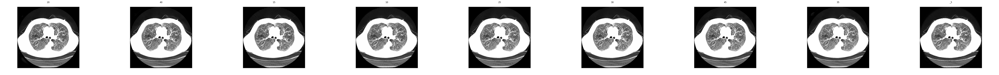

In [ ]:
fig = plt.figure(figsize=(100,100))
for i in range(len(infered)):
  fig.add_subplot(1, len(infered), i + 1).set_title(infered[i][-7:-5])
  _ = plt.imshow(cv2.imread(os.path.join(inf_64,   infered[i])))
  plt.axis("off")
plt.show()

model_20.h5 Loaded!
1/1 [==============================] - 12s 12s/step


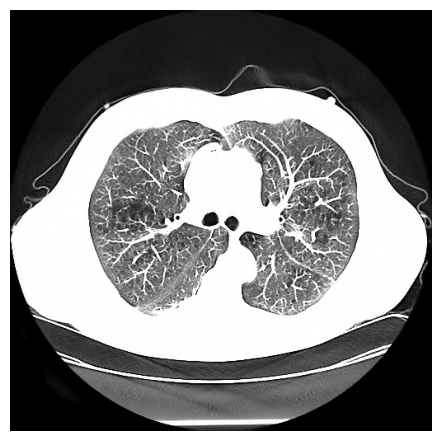

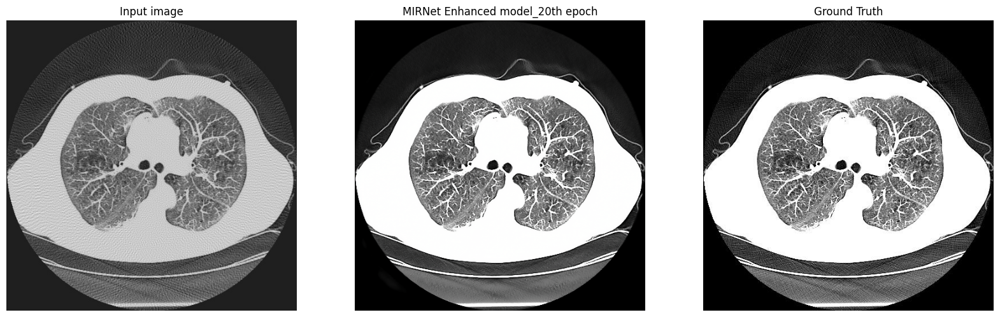

model_40.h5 Loaded!
1/1 [==============================] - 9s 9s/step


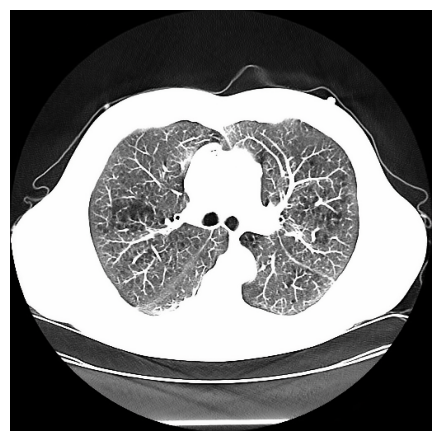

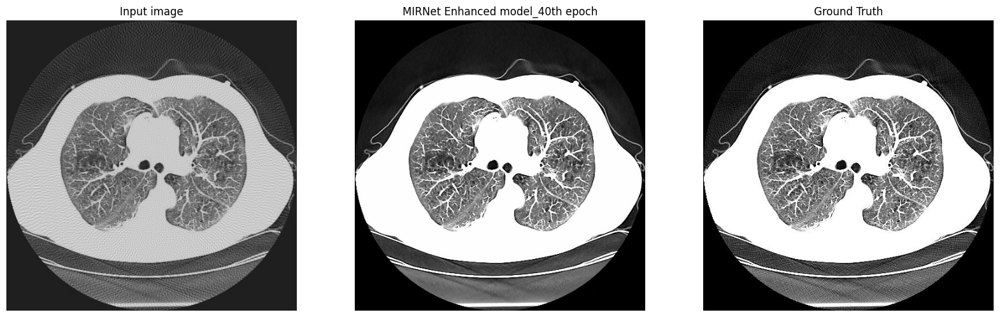

model_15.h5 Loaded!
1/1 [==============================] - 9s 9s/step


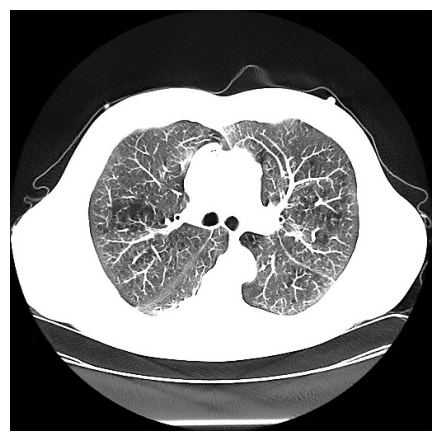

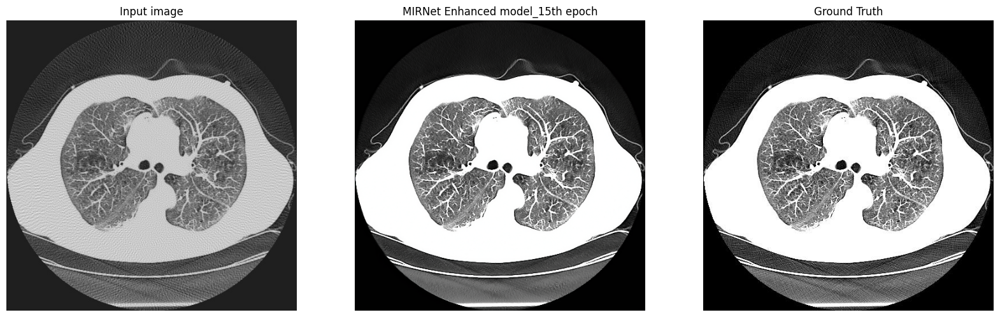

model_10.h5 Loaded!
1/1 [==============================] - 8s 8s/step


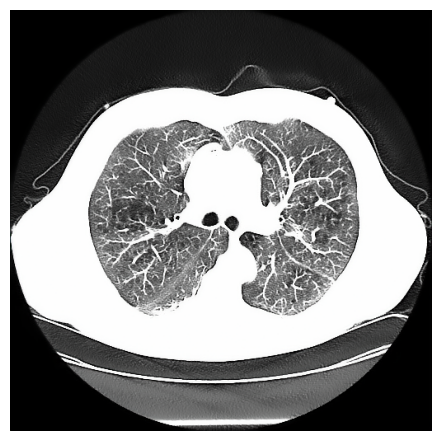

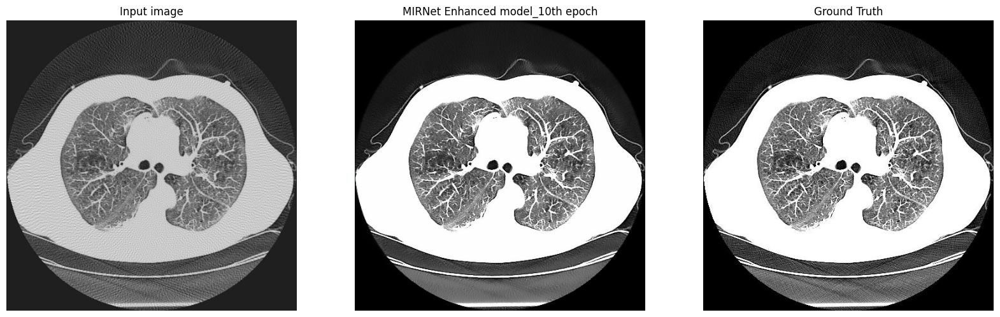

model_25.h5 Loaded!
1/1 [==============================] - 9s 9s/step


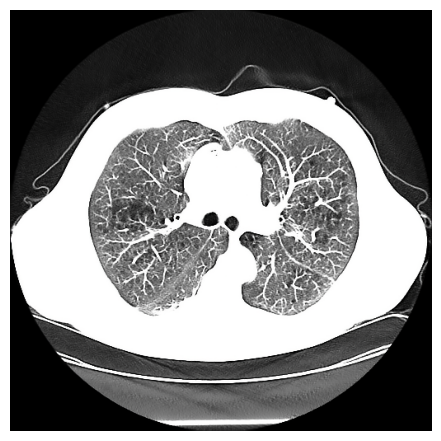

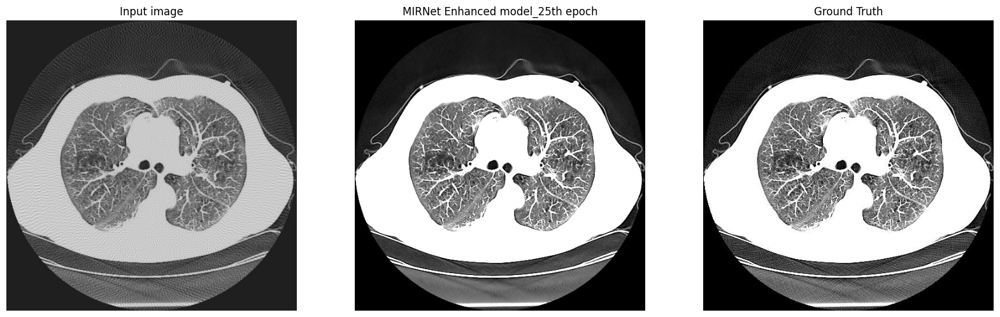

model_30.h5 Loaded!
1/1 [==============================] - 9s 9s/step


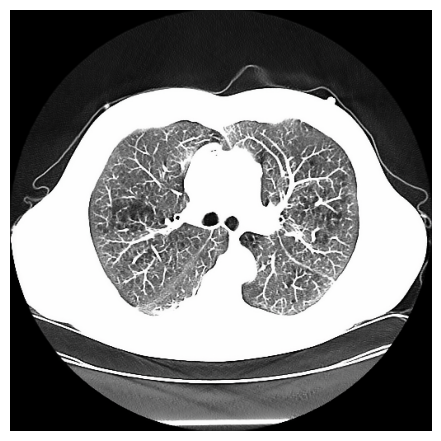

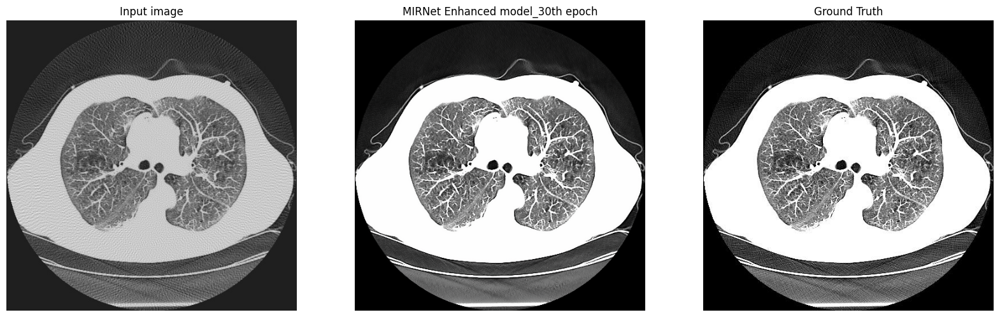

model_45.h5 Loaded!
1/1 [==============================] - 8s 8s/step


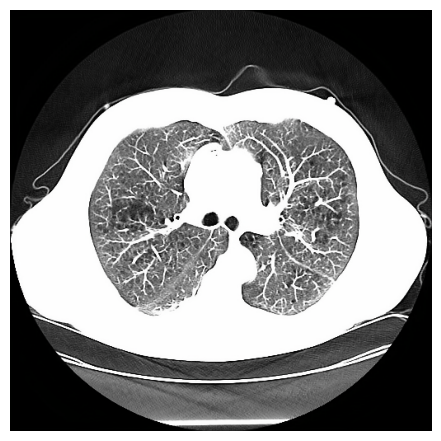

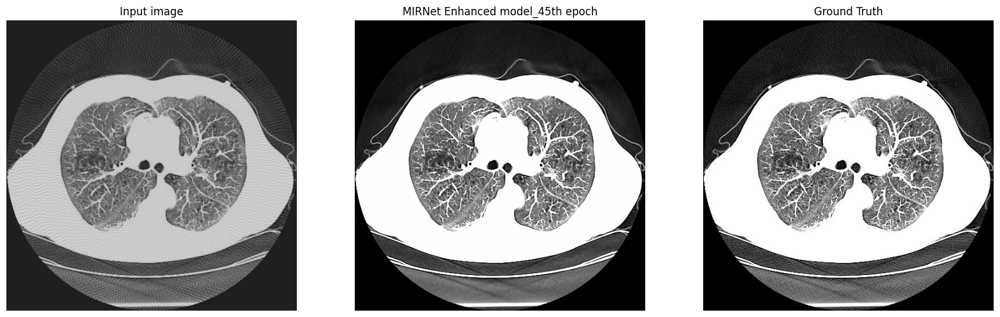

model_35.h5 Loaded!
1/1 [==============================] - 8s 8s/step


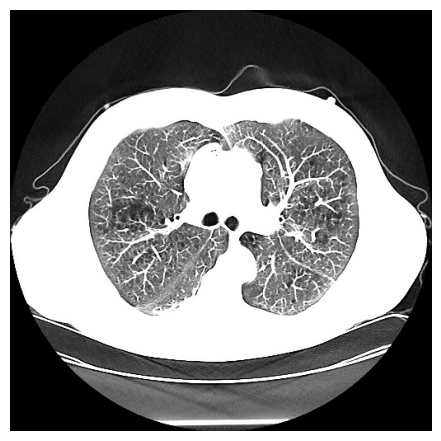

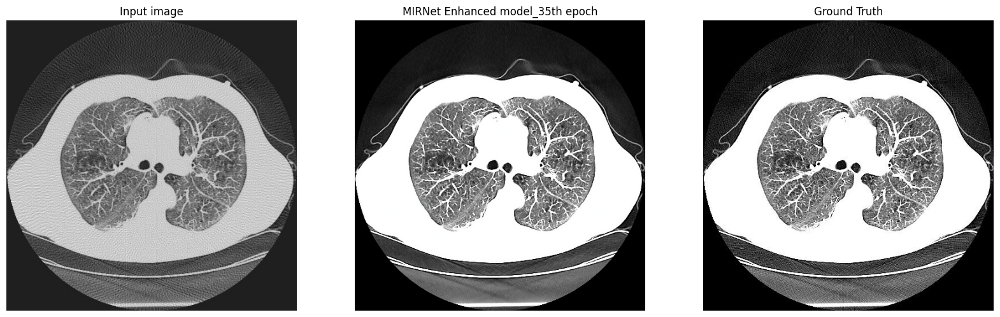

model_5.h5 Loaded!
1/1 [==============================] - 9s 9s/step


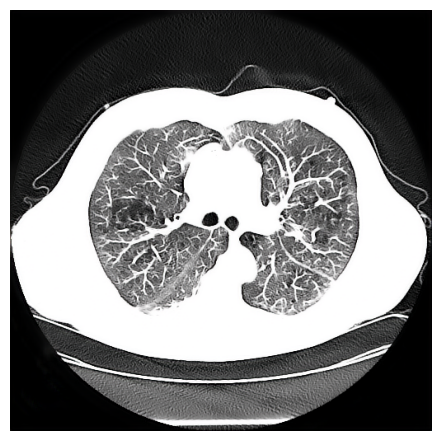

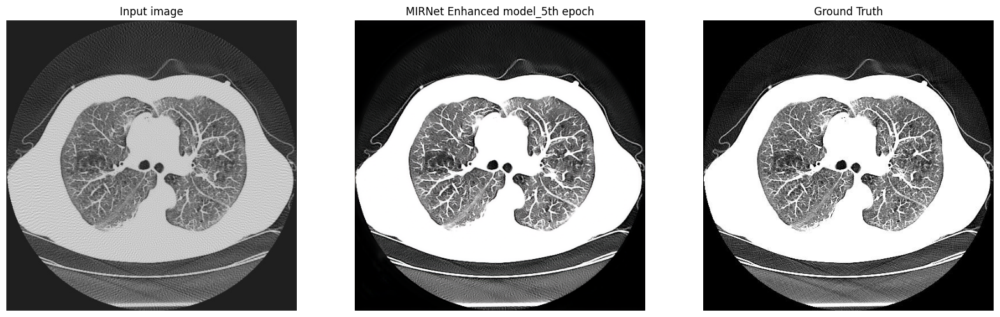

In [ ]:
for model in list_models:
  model_loaded = load_model(os.path.join(dir_models, model),custom_objects= custom_objects )
  print(f'{model} Loaded!')
  # for low_light_image, target in zip(test_low_light_images, test_enhanced_images):
  proj_img = Image.open(proj_48)
  target = Image.open(og_48)
  enhanced_image = infer(proj_img, model_loaded=model_loaded)

#   print(enhanced_image.size)
#   print(target.size)
  # enhanced_image.save(f'/content/drive/MyDrive/MIRNet/results/enhancements/img_235_64_{model[:-3]}.jpeg')
# SAVING THE ENHANCED
  plt.imshow(enhanced_image)
  plt.tight_layout()
  plt.axis('off')
  plt.savefig(f'/content/drive/MyDrive/MIRNet/results/enhancements/192/img_39_96_{model[:-3]}.jpeg')

#  plot--> comparison
  plot_results(
      [proj_img, enhanced_image, target],
      ["Input image", f"MIRNet Enhanced {model[:-3]}th epoch", "Ground Truth"],
      (20, 12),
  )

In [ ]:
import numpy as np
from skimage.io import imread

# def calculate_psnr(image1, image2):
#   mse = np.mean((image1 - image2) ** 2)
#   max_value = np.max(image1)
#   psnr = 20 * np.log10(max_value) - 10 * np.log10(mse)
#   return psnr

for low_light_image, target in zip(test_low_light_images, test_enhanced_images):
  original_image = imread(low_light_image)
  target = imread(target)
  # gen = infer(original_image)
  gen = imread(og)
  psnr = calculate_psnr(target, gen)
  print(psnr)
  image_difference = np.abs(target - gen)
  plt.imshow(image_difference)
  plt.colorbar()
  plt.title(f"Image Difference (PSNR: {psnr:.2f} dB)")
  plt.show()

## Line Profiles


In [ ]:
pred = '/content/drive/MyDrive/MIRNet/results/enhancements/img_235_48_model_45.jpeg'
proj = '/content/drive/MyDrive/infer_was/pro/img_235_48.jpeg'
# og = '/content/drive/MyDrive/GAN/test/original/img_235_48.jpeg'
og = '/content/drive/MyDrive/infer_was/og/img_235_48.jpeg'

import numpy as np
from skimage.draw import line
from skimage.io import imread
import matplotlib.pyplot as plt

def get_diff_line(image1, image2):

  # Load your images (image1 and image2)
  image1 = imread(image1)
  image2 = imread(image2)

  x1, x2, y1, y2 = 100, 100, 100 , 450
  x1, x2, y1, y2 = 50, 300, 250 , 250

  # Define starting and ending points of the line
  start_point = (y1, x1)  # Replace with your starting point coordinates
  end_point = (y2, x2)    # Replace with your ending point coordinates

  # Get coordinates of the line pixels
  line_coords = line(*start_point, *end_point)

  # Extract intensity values along the line from both images
  intensity_profile_image1 = image1[line_coords]
  intensity_profile_image2 = image2[line_coords]
  return line_coords, intensity_profile_image1, intensity_profile_image2, x1,x2,y1,y2

## Qualitative


In [ ]:
dir_enh = '/content/drive/MyDrive/GAN/percep'
list_enh = os.listdir(dir_enh)

In [ ]:
list_enh

['7.jpeg',
 '9.jpeg',
 '6.jpeg',
 '3.jpeg',
 '2.jpeg',
 '4.jpeg',
 '5.jpeg',
 '8.jpeg',
 '1.jpeg']

In [ ]:
import numpy as np

In [ ]:
import math
import numpy as np
import cv2

def ssim(img1, img2):
    C1 = (0.01 * 255)**2
    C2 = (0.03 * 255)**2

    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    kernel = cv2.getGaussianKernel(11, 1.5)
    window = np.outer(kernel, kernel.transpose())

    mu1 = cv2.filter2D(img1, -1, window)[5:-5, 5:-5]  # valid
    mu2 = cv2.filter2D(img2, -1, window)[5:-5, 5:-5]
    mu1_sq = mu1**2
    mu2_sq = mu2**2
    mu1_mu2 = mu1 * mu2
    sigma1_sq = cv2.filter2D(img1**2, -1, window)[5:-5, 5:-5] - mu1_sq
    sigma2_sq = cv2.filter2D(img2**2, -1, window)[5:-5, 5:-5] - mu2_sq
    sigma12 = cv2.filter2D(img1 * img2, -1, window)[5:-5, 5:-5] - mu1_mu2

    ssim_map = ((2 * mu1_mu2 + C1) * (2 * sigma12 + C2)) / ((mu1_sq + mu2_sq + C1) *
                                                            (sigma1_sq + sigma2_sq + C2))
    return ssim_map.mean()


def calculate_ssim(img1, img2):
    '''calculate SSIM
    the same outputs as MATLAB's
    img1, img2: [0, 255]
    '''
    if not img1.shape == img2.shape:
        raise ValueError('Input images must have the same dimensions.')
    if img1.ndim == 2:
        return ssim(img1, img2)
    elif img1.ndim == 3:
        if img1.shape[2] == 3:
            ssims = []
            for i in range(3):
                ssims.append(ssim(img1, img2))
            return np.array(ssims).mean()
        elif img1.shape[2] == 1:
            return ssim(np.squeeze(img1), np.squeeze(img2))
    else:
        raise ValueError('Wrong input image dimensions.')

def calculate_psnr(img1, img2):
    # img1 and img2 have range [0, 255]
    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    mse = np.mean((img1 - img2)**2)
    if mse == 0:
        return float('inf')
    return 70 * math.log10(255.0 / math.sqrt(mse))


In [ ]:
from skimage.transform import resize

def calculate_loss(pred, og):
  original_image = imread(og)
  pred = imread(pred)

  scale_factor = 2.0

  scaled_image_og = original_image * scale_factor
  scaled_image_og = np.clip(scaled_image_og, 0, 255)

  scaled_image_pred = pred * scale_factor
  scaled_image_pred = np.clip(scaled_image_pred, 0, 255)

  psnr = calculate_psnr(scaled_image_og, scaled_image_pred)
  ssim = structural_similarity(original_image, pred)
  char = np.mean(np.sqrt(original_image - pred) + np.square(1e-3))
  # char = charbonnier_loss(original_image, pred)
  return psnr, ssim, char

for image with 48 projections and ground truth

In [ ]:
pred = '/content/drive/MyDrive/MIRNet/results/enhancements/img_235_48_model_45.jpeg'
proj = '/content/drive/MyDrive/GAN/gan_ref/proj/og.png'
# og = '/content/drive/MyDrive/GAN/test/original/img_235_48.jpeg'
og = '/content/drive/MyDrive/GAN/gan_ref/og/og.png'

print(calculate_loss(proj, og))


(25.875141536841852, <tf.Tensor: shape=(), dtype=float32, numpy=0.30830675>, 11.47)


In [ ]:
og = '/content/drive/MyDrive/GAN/gan_ref/og/og.png'

psnr_list = []
ssim_list = []
char_loss_list = []

for pred_path in list_enh:
  print(pred_path)
  pred = os.path.join(dir_enh, pred_path)
  psnr, ssim, charb = calculate_loss(pred, og)
  psnr_list.append(psnr)
  ssim_list.append(ssim)
  char_loss_list.append(charb)


7.jpeg
9.jpeg
6.jpeg
3.jpeg
2.jpeg
4.jpeg
5.jpeg
8.jpeg
1.jpeg


In [ ]:
psnr_list

[68.13614314270507,
 68.61416510912818,
 68.39222379479473,
 69.16571867593142,
 69.2902432583822,
 68.19516072650754,
 67.9198066467425,
 68.40527177009166,
 69.65869350897563]

In [ ]:
ssim_list

[<tf.Tensor: shape=(), dtype=float32, numpy=0.6800454>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.6803302>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.6796915>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.6874128>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.68803924>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.68230844>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.6780998>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.68020314>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.68478376>]

In [ ]:
char_loss_list

[5.92, 5.855, 5.92, 5.83, 5.76, 5.926, 5.94, 5.883, 5.617]

In [ ]:
from matplotlib import colors
from matplotlib import patches
# prediction and gt

psnr_list = []
ssim_list = []
char_loss_list = []

for pred_path in list_enh:
  print(pred_path)
  pred = os.path.join(dir_enh, pred_path)
  psnr, ssim, charb = calculate_loss(pred, og)
  psnr_list.append(psnr)
  ssim_list.append(ssim)
  char_loss_list.append(charb)


  pred_line_coords,groundTruth_intensity, intensity_pred, x1,x2,y1,y2 = get_diff_line(og,pred)
  # proj and Gt
  proj_line_coords,groundTruth_intensity, intensity_proj, x1,x2,y1,y2 = get_diff_line(og,proj)


  # Create an array of pixel positions along the line
  pred_pixel_positions = np.arange(len(pred_line_coords[0]))
  print(len(pred_pixel_positions))
  proj_pixel_positions = np.arange(len(proj_line_coords[0]))

  # Plot the intensity profiles along with images
  fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(16, 9))
  # Plot Image 1
  ax1 = plt.subplot2grid(shape=(3, 5), loc=(0, 0), colspan=1, rowspan=3)
  ax1.imshow(imread(proj), cmap='gray')
  ax1.plot([x1, x2], [y1, y2], color='red', linewidth=2, label='Line')
  # ax1.set_title('48 Projections')
  ax1.axis('off')

  # Plot Image 2
  ax2 = plt.subplot2grid(shape=(3, 5), loc=(0, 1), colspan=1, rowspan=3)
  ax2.imshow(imread(og), cmap='gray')
  ax2.plot([x1, x2], [y1, y2], color='red', linewidth=2, label='Line')
  # ax2.set_title('Ground Truth')
  ax2.axis('off')

  # Plot Image 2
  ax3 = plt.subplot2grid(shape=(3, 5), loc=(0, 2), colspan=1, rowspan=3)
  ax3.imshow(imread(pred), cmap='gray')
  ax3.plot([x1, x2], [y1, y2], color='red', linewidth=2, label='Line')
  # ax3.set_title('Mir-NeT Enhanced')
  ax3.axis('off')


  ax4 = plt.subplot2grid(shape=(3, 5), loc=(1, 3), colspan=2, rowspan= 1)
  line1 = ax4.plot(pred_pixel_positions, groundTruth_intensity, label='Ground Truth', color = 'red')
  line2 = ax4.plot(proj_pixel_positions, intensity_proj, label='48 projections', color = 'cyan')
  line3 = ax4.plot(pred_pixel_positions, intensity_pred, label='Mir-Net Enhanced', color = 'green')
  ax4.set_xlabel('Pixel Position')
  ax4.set_ylabel('Intensity')
  # ax4.set_title('Intensity Profile Comparison')

  # red_patch = mpatches.Patch(color='red', label='Ground Truth')
  # cyan_patch = mpatches.Patch(color='cyan', label='48 Projections')
  # green_patch = mpatches.Patch(color='green', label='Mir-Net Enhanced')

  # ax4.legend(handles=[red_patch, cyan_patch, green_patch], bbox_to_anchor=(0., 1.1, 1., .102), loc='lower left',
  #                       ncols=2, mode="expand", borderaxespad=0.8)
  ax4.grid()


  plt.tight_layout()
  plt.savefig(f'/content/drive/MyDrive/GAN/was/predictions/{pred_path}.jpeg')
plt.show()

In [ ]:
line1 = plt.plot(pred_pixel_positions, groundTruth_intensity, label='Ground Truth', color = 'red')
line2 = plt.plot(proj_pixel_positions, intensity_proj, label='48 projections', color = 'cyan')
line3 = plt.plot(pred_pixel_positions, intensity_pred, label='Mir-Net Enhanced', color = 'green')
plt.xlabel('Pixel Position')
plt.ylabel('Intensity')
plt.title('Intensity Profile Comparison')

red_patch = patches.Patch(color='red', label='Ground Truth')
cyan_patch = patches.Patch(color='cyan', label='48 Projections')
green_patch = patches.Patch(color='green', label='Mir-Net Enhanced')

plt.legend(handles=[red_patch, cyan_patch, green_patch],
           bbox_to_anchor=(0., 1.08, 1., .102), loc='lower left',
                      ncols=2, mode="expand", borderaxespad=0.)
plt.grid()
plt.tight_layout()
# plt.savefig('/content/drive/MyDrive/mirnet/predictions/lineprofiles/48_25_graph.jpeg')
plt.show()

In [ ]:
psnr_list

In [ ]:
ssim_list

In [ ]:
char_loss_list

In [ ]:
import pandas as pd

In [ ]:
# pd.DataFrame([psnr_list, ssim_list, char_loss_list] ,columns= ['PSNR', 'SSIM', 'CHARBONNIER'])

df = pd.DataFrame({
'PSNR': psnr_list,
'SSIM':ssim_list,
'CHARBONNIER':char_loss_list,
})

In [ ]:
df

,PSNR,SSIM,CHARBONNIER
0,68.136143,"tf.Tensor(0.6800454, shape=(), dtype=float32)",5.921875
1,68.614165,"tf.Tensor(0.6803302, shape=(), dtype=float32)",5.855469
2,68.392224,"tf.Tensor(0.6796915, shape=(), dtype=float32)",5.921875
3,69.165719,"tf.Tensor(0.6874128, shape=(), dtype=float32)",5.828125
4,69.290243,"tf.Tensor(0.68803924, shape=(), dtype=float32)",5.761719
5,68.195161,"tf.Tensor(0.68230844, shape=(), dtype=float32)",5.925781
6,67.919807,"tf.Tensor(0.6780998, shape=(), dtype=float32)",5.941406
7,68.405272,"tf.Tensor(0.68020314, shape=(), dtype=float32)",5.882812
8,69.658694,"tf.Tensor(0.68478376, shape=(), dtype=float32)",5.617188


In [ ]:
df['PSNR'].mean()         # pandas default degrees of freedom is one

69.57172043222663

In [ ]:
out = df.agg({'PSNR':['mean', 'std'],'SSIM':['mean', 'std'],'CHARBONNIER':['mean', 'std'] })

In [ ]:
out

,PSNR,SSIM,CHARBONNIER
mean,68.641936,0.682324,5.851562
std,0.594189,0.003589,0.104858


In [ ]:
out.to_csv('/content/drive/MyDrive/MIRNet/comparision.csv')